In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:

img1 = cv2.imread('panorama_dataset/a.png')
img2 = cv2.imread('panorama_dataset/b.png')


gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

In [3]:

sift = cv2.SIFT_create()


kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

print("Number of keypoints in image1:", len(kp1))
print("Number of keypoints in image2:", len(kp2))
print("Descriptor size for SIFT:", des1.shape[1])


Number of keypoints in image1: 5644
Number of keypoints in image2: 3756
Descriptor size for SIFT: 128


In [4]:

img1_kp = cv2.drawKeypoints(img1, kp1, None,
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp = cv2.drawKeypoints(img2, kp2, None,
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


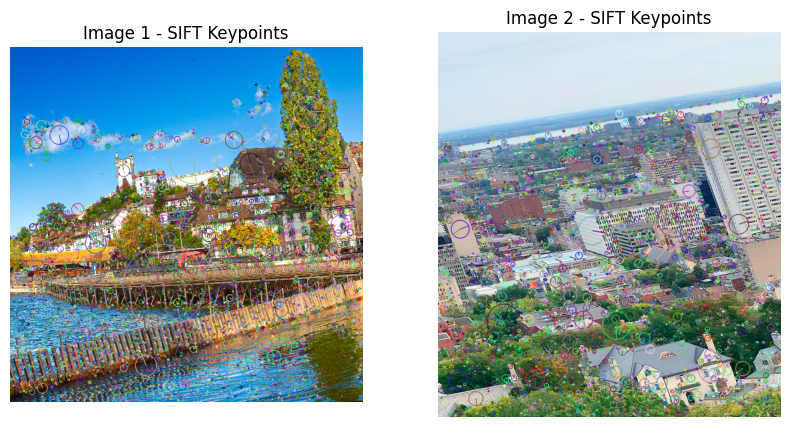

In [5]:
plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img1_kp, cv2.COLOR_BGR2RGB))
plt.title('Image 1 - SIFT Keypoints')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img2_kp, cv2.COLOR_BGR2RGB))
plt.title('Image 2 - SIFT Keypoints')
plt.axis('off')
plt.show()


In [ ]:
import cv2
import numpy as np

MIN_MATCH_COUNT = 4  

if len(good_matches) < MIN_MATCH_COUNT:
    print(f"Not enough matches found! Only {len(good_matches)} matches, need at least 4.")
else:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    
    np.savetxt('homography_matrix.csv', H, delimiter=',')

    print("Homography matrix:\n", H)
    print("Inliers used by RANSAC:", np.sum(mask))
    print("Saved homography_matrix.csv")


Homography matrix:
 [[-1.91455465e-01 -2.32200881e-01  1.19800049e+02]
 [-2.97050925e-01 -3.92934290e-01  2.10959581e+02]
 [-1.35287351e-03 -1.71113885e-03  1.00000000e+00]]
Inliers used by RANSAC: 6
Saved homography_matrix.csv


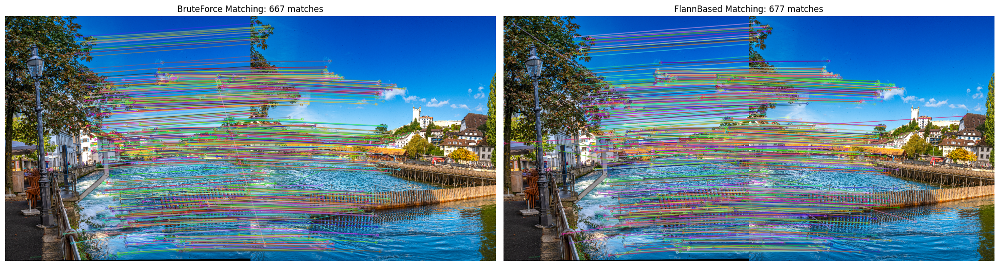

Number of good matches with BruteForce: 667
Number of good matches with FlannBased: 677


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the images
img1 = cv2.imread('panorama_dataset/image1.png')
img2 = cv2.imread('panorama_dataset/image2.png')

# Convert images to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Initialize the SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# BruteForce Matcher
bf = cv2.BFMatcher()
matches_bf = bf.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test to filter good matches
good_matches_bf = []
for m, n in matches_bf:
    if m.distance < 0.75 * n.distance:
        good_matches_bf.append(m)

# FlannBased Matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches_flann = flann.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test for FlannBased matches
good_matches_flann = []
for m, n in matches_flann:
    if m.distance < 0.75 * n.distance:
        good_matches_flann.append(m)

# Draw BruteForce matches
img_matches_bf = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_bf, None, 
                               flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Draw FlannBased matches
img_matches_flann = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_flann, None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display matches
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_matches_bf, cv2.COLOR_BGR2RGB))
plt.title(f'BruteForce Matching: {len(good_matches_bf)} matches')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_matches_flann, cv2.COLOR_BGR2RGB))
plt.title(f'FlannBased Matching: {len(good_matches_flann)} matches')
plt.axis('off')

plt.tight_layout()
plt.savefig('feature_matching_comparison.png')
plt.show()

print(f"Number of good matches with BruteForce: {len(good_matches_bf)}")
print(f"Number of good matches with FlannBased: {len(good_matches_flann)}")

Homography Matrix:
[[ 8.98987459e-01 -1.31235742e-01 -1.64446487e+02]
 [ 1.43102993e-01  9.90668121e-01 -6.93874237e+01]
 [-1.89449059e-07  3.68175340e-07  1.00000000e+00]]

Homography matrix saved to 'homography_matrix.csv'


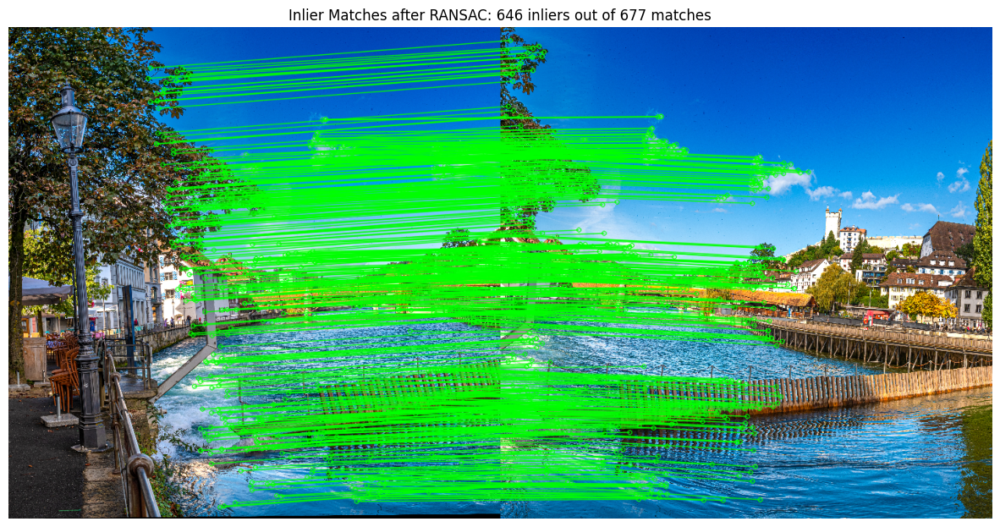

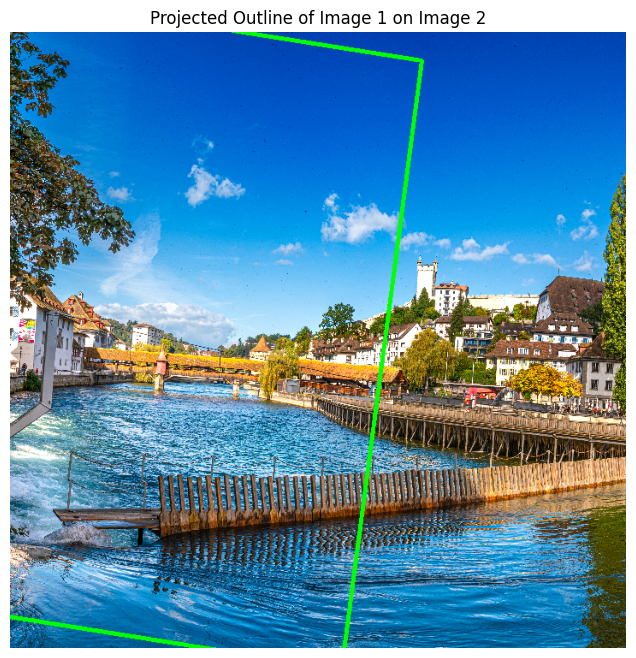

In [ ]:
if len(good_matches_flann) >= 4: 
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches_flann]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches_flann]).reshape(-1, 1, 2)
    
    
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    
    np.savetxt('2021282_homography.csv', H, delimiter=',')
    
    print("Homography Matrix:")
    print(H)
    print("\nHomography matrix saved to 'homography_matrix.csv'")
    
    
    matchesMask = mask.ravel().tolist()
    
    
    draw_params = dict(matchColor=(0, 255, 0),  # green color for matches
                       singlePointColor=None,
                       matchesMask=matchesMask,  # draw only inliers
                       flags=2)
    
    
    img_inliers = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_flann, None, **draw_params)
    
    
    plt.figure(figsize=(15, 8))
    plt.imshow(cv2.cvtColor(img_inliers, cv2.COLOR_BGR2RGB))
    plt.title(f'Inlier Matches after RANSAC: {np.sum(mask)} inliers out of {len(good_matches_flann)} matches')
    plt.axis('off')
    plt.savefig('ransac_inliers.png')
    plt.show()
    
    
    h, w = gray1.shape
    pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
    dst = cv2.perspectiveTransform(pts, H)
    
    
    img2_with_outline = img2.copy()
    img2_with_outline = cv2.polylines(img2_with_outline, [np.int32(dst)], True, (0, 255, 0), 3)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img2_with_outline, cv2.COLOR_BGR2RGB))
    plt.title('Projected Outline of Image 1 on Image 2')
    plt.axis('off')
    plt.savefig('projected_outline.png')
    plt.show()
else:
    print("Not enough good matches found for homography estimation")

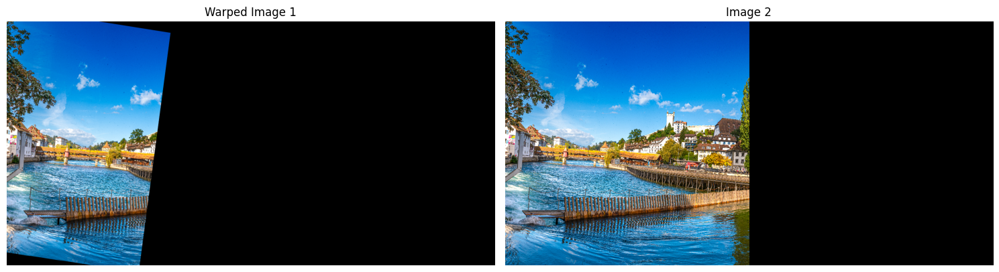

In [ ]:

h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]


result_width = w1 + w2
result_height = max(h1, h2)


warped_img1 = cv2.warpPerspective(img1, H, (result_width, result_height))


side_by_side = np.zeros((result_height, result_width, 3), dtype=np.uint8)

side_by_side[0:h2, 0:w2] = img2


plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(warped_img1, cv2.COLOR_BGR2RGB))
plt.title('Warped Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(side_by_side, cv2.COLOR_BGR2RGB))
plt.title('Image 2')
plt.axis('off')

plt.tight_layout()
plt.savefig('warped_images_side_by_side.png')
plt.show()

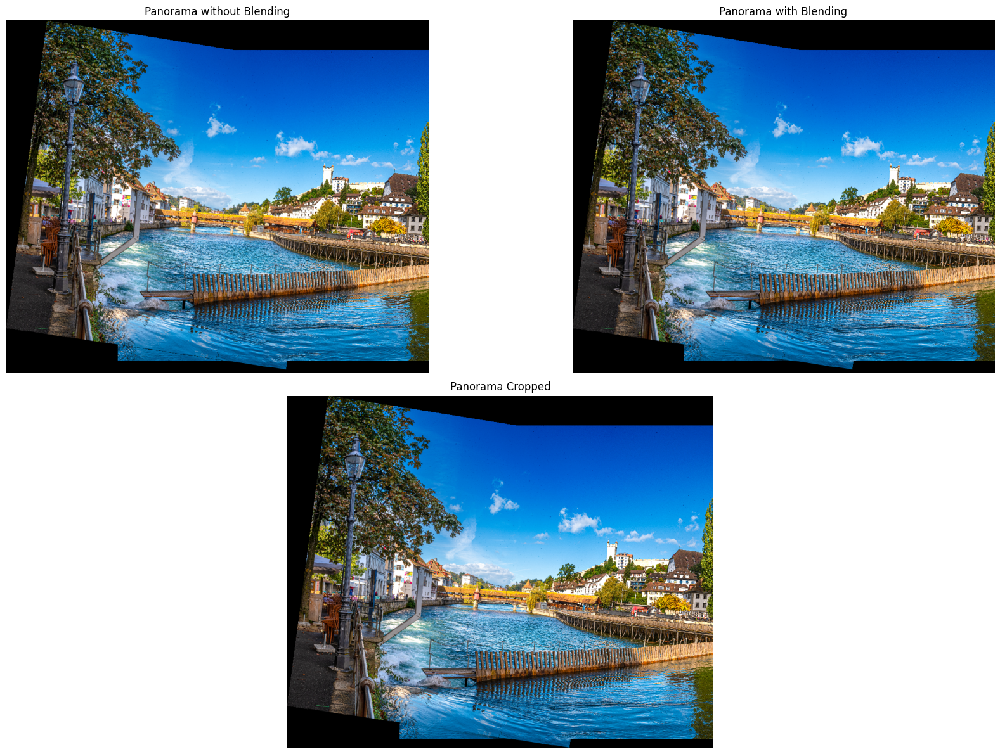

In [ ]:

def stitch_images(img1, img2, H):
    
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    
    corners1 = np.array([[0, 0], [0, h1], [w1, h1], [w1, 0]], dtype=np.float32).reshape(-1, 1, 2)
    transformed_corners1 = cv2.perspectiveTransform(corners1, H)
    
    
    min_x = min(0, transformed_corners1[:, 0, 0].min())
    max_x = max(w2, transformed_corners1[:, 0, 0].max())
    min_y = min(0, transformed_corners1[:, 0, 1].min())
    max_y = max(h2, transformed_corners1[:, 0, 1].max())
    
    
    panorama_width = int(max_x - min_x)
    panorama_height = int(max_y - min_y)
    offset_x = -int(min_x)
    offset_y = -int(min_y)
    
    
    translation_matrix = np.array([
        [1, 0, offset_x],
        [0, 1, offset_y],
        [0, 0, 1]
    ])
    
    # Combine homography with translation
    full_homography = translation_matrix @ H
    
    # Create panorama canvas
    panorama = np.zeros((panorama_height, panorama_width, 3), dtype=np.uint8)
    
    # Warp img1 onto the panorama
    cv2.warpPerspective(img1, full_homography, (panorama_width, panorama_height), 
                       dst=panorama, borderMode=cv2.BORDER_TRANSPARENT)
    
    # Create a version of panorama with img2 placed at the offset
    img2_offset = np.zeros_like(panorama)
    img2_offset[offset_y:offset_y+h2, offset_x:offset_x+w2] = img2
    
    # Create panorama without blending (just overlay)
    panorama_no_blend = panorama.copy()
    
    # Add img2 where panorama is black (no blending)
    panorama_mask = (panorama == 0).all(axis=2)
    panorama_no_blend[panorama_mask] = img2_offset[panorama_mask]
    
    
    alpha = 0.5
    overlap_mask = ~panorama_mask & (img2_offset != 0).any(axis=2)
    panorama_with_blend = panorama.copy()
    panorama_with_blend[overlap_mask] = (alpha * panorama[overlap_mask] + 
                                       (1 - alpha) * img2_offset[overlap_mask]).astype(np.uint8)
    panorama_with_blend[panorama_mask] = img2_offset[panorama_mask]
    
    # Apply a better blending - feathering at the seams
    # Create a mask for img1 warped region
    mask1 = np.zeros((panorama_height, panorama_width), dtype=np.uint8)
    cv2.warpPerspective(np.ones((h1, w1), dtype=np.uint8)*255, 
                        full_homography, (panorama_width, panorama_height), 
                        dst=mask1, borderMode=cv2.BORDER_TRANSPARENT)
    
    # Create a mask for img2
    mask2 = np.zeros((panorama_height, panorama_width), dtype=np.uint8)
    mask2[offset_y:offset_y+h2, offset_x:offset_x+w2] = 255
    
    # Calculate the distance from the border for each mask
    dist1 = cv2.distanceTransform(mask1, cv2.DIST_L2, 3)
    dist2 = cv2.distanceTransform(mask2, cv2.DIST_L2, 3)
    
    # Calculate weight maps
    weight1 = dist1 / (dist1 + dist2 + 1e-6)
    weight2 = dist2 / (dist1 + dist2 + 1e-6)
    
    # Expand dimensions for element-wise multiplication
    weight1 = np.repeat(weight1[:, :, np.newaxis], 3, axis=2)
    weight2 = np.repeat(weight2[:, :, np.newaxis], 3, axis=2)
    
    # Blend using the distance-based weights
    panorama_blended = np.zeros_like(panorama)
    panorama_blended = (weight1 * panorama + weight2 * img2_offset).astype(np.uint8)
    
    
    non_zero_rows = np.any(panorama_blended, axis=1)
    non_zero_cols = np.any(panorama_blended, axis=0)
    
    row_indices = np.where(non_zero_rows)[0]
    col_indices = np.where(non_zero_cols)[0]
    
    if len(row_indices) > 0 and len(col_indices) > 0:
        panorama_cropped = panorama_blended[
            min(row_indices):max(row_indices)+1,
            min(col_indices):max(col_indices)+1
        ]
    else:
        panorama_cropped = panorama_blended
    
    return panorama_no_blend, panorama_blended, panorama_cropped

# Create the panoramas
panorama_no_blend, panorama_blended, panorama_cropped = stitch_images(img1, img2, H)

# Display the results
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(panorama_no_blend, cv2.COLOR_BGR2RGB))
plt.title('Panorama without Blending')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(panorama_blended, cv2.COLOR_BGR2RGB))
plt.title('Panorama with Blending')
plt.axis('off')
    
plt.subplot(2, 1, 2)
plt.imshow(cv2.cvtColor(panorama_cropped, cv2.COLOR_BGR2RGB))
plt.title('Panorama Cropped')
plt.axis('off')

plt.tight_layout()
plt.savefig('panorama_results.png')
plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import glob
from collections import defaultdict


def extract_color_histogram(image, bins=32):

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    
    hist_h = cv2.calcHist([hsv], [0], None, [bins], [0, 180])
    hist_s = cv2.calcHist([hsv], [1], None, [bins], [0, 256])
    hist_v = cv2.calcHist([hsv], [2], None, [bins], [0, 256])
    
    
    cv2.normalize(hist_h, hist_h, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(hist_s, hist_s, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(hist_v, hist_v, 0, 1, cv2.NORM_MINMAX)
    
    
    hist_features = np.concatenate([hist_h.flatten(), hist_s.flatten(), hist_v.flatten()])
    
    return hist_features


def compute_matches(img1, img2):

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    

    sift = cv2.SIFT_create()
    
    # Find keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)
    
    # Check if we have descriptors
    if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
        return kp1, kp2, []
    
    # FLANN based matcher
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    try:
        matches = flann.knnMatch(des1, des2, k=2)
        
        # Apply Lowe's ratio test
        good_matches = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good_matches.append(m)
                
        return kp1, kp2, good_matches
    except Exception as e:
        print(f"Error in matching: {e}")
        return kp1, kp2, []


def compute_homography(kp1, kp2, good_matches):
    if len(good_matches) >= 4:
        try:
            src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            
            # Compute homography using RANSAC
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            return H, sum(mask) if mask is not None else 0  # Return homography and inlier count
        except Exception as e:
            print(f"Error computing homography: image does not belong to this cluster")
            return None, 0
    return None, 0


def find_stitching_order(images):
    num_images = len(images)
    if num_images <= 1:
        return list(range(num_images))
    
    
    match_scores = {}
    for i in range(num_images):
        for j in range(i+1, num_images):
            kp_i, kp_j, good_matches = compute_matches(images[i], images[j])
            
            if len(good_matches) < 4:
                print(f"Not enough good matches between images {i} and {j}")
                continue
                
            H_ij, inliers_ij = compute_homography(kp_i, kp_j, good_matches)
            H_ji, inliers_ji = compute_homography(kp_j, kp_i, good_matches)
            
            
            inliers = max(inliers_ij if inliers_ij else 0, inliers_ji if inliers_ji else 0)
            if inliers > 0:
                match_scores[(i, j)] = inliers
    
    
    if not match_scores:
        print("No good matches found between any images. Using sequential order.")
        return list(range(num_images))
    
    
    graph = defaultdict(list)
    for (i, j), score in match_scores.items():
        graph[i].append((j, score))
        graph[j].append((i, score))
    
    
    if not graph:
        return list(range(num_images))
        
    start_idx = max(graph.keys(), key=lambda k: sum(score for _, score in graph[k]))
    
    
    visited = [False] * num_images
    visited[start_idx] = True
    order = [start_idx]
    
    
    while len(order) < num_images:
        best_score = -1
        next_img = -1
        
        
        for last in order:
            if last in graph:  # Check if the node exists in the graph
                for neighbor, score in graph[last]:
                    if not visited[neighbor] and score > best_score:
                        best_score = score
                        next_img = neighbor
        
        if next_img == -1:  # No more connections, add any remaining images
            for i in range(num_images):
                if not visited[i]:
                    next_img = i
                    break
        
        visited[next_img] = True
        order.append(next_img)
    
    return order


def create_panorama(images):
    if len(images) == 0:
        print("No images to create panorama")
        return None
    if len(images) == 1:
        return images[0]
    
    
    order = find_stitching_order(images)
    ordered_images = [images[i] for i in order]
    
    print(f"Stitching order: {order}")
    
    
    result = ordered_images[0]
    
    
    for i in range(1, len(ordered_images)):
        print(f"Stitching image {order[i]}...")
        
        
        kp1, kp2, good_matches = compute_matches(result, ordered_images[i])
        
        if len(good_matches) < 10:
            print(f"Not enough good matches with image {order[i]} (found {len(good_matches)})")
            continue
        
        
        H, inliers = compute_homography(kp1, kp2, good_matches)
        
        if H is not None and inliers > 10:  # Ensure we have enough inliers
            
            try:
                result = stitch_images(result, ordered_images[i], H)
            except Exception as e:
                print(f"Error while stitching: {e}")
            
        else:
            print(f"Could not find enough inliers with image {order[i]}")
            
            
            kp2, kp1, good_matches = compute_matches(ordered_images[i], result)
            
            if len(good_matches) < 10:
                print(f"Not enough good matches in reverse direction with image {order[i]}")
                continue
                
            H, inliers = compute_homography(kp2, kp1, good_matches)
            
            if H is not None and inliers > 10:
                # If reverse works, stitch in that direction
                try:
                    new_result = stitch_images(ordered_images[i], result, H)
                    result = new_result
                except Exception as e:
                    print(f"Error while stitching in reverse: {e}")
                    # Continue with the current result
            else:
                print(f"Skipping image {order[i]} due to insufficient matches")
    
    
    try:
        gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            
            max_contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(max_contour)
            
            
            result = result[y:y+h, x:x+w]
    except Exception as e:
        print(f"Error while cropping: {e}")
    
    return result


def cluster_images(image_paths, n_clusters=3):
    print(f"Clustering {len(image_paths)} images into {n_clusters} groups...")
    
    
    if len(image_paths) < n_clusters:
        print(f"Warning: Not enough images ({len(image_paths)}) for {n_clusters} clusters. Using sequential grouping.")
    
        clustered_images = [[] for _ in range(n_clusters)]
        for i, path in enumerate(image_paths):
            clustered_images[i % n_clusters].append(path)
        return clustered_images
    
    
    features = []
    valid_paths = []
    
    for img_path in image_paths:
        try:
            img = cv2.imread(img_path)
            if img is None:
                print(f"Warning: Could not read image {img_path}")
                continue
            features.append(extract_color_histogram(img))
            valid_paths.append(img_path)
        except Exception as e:
            print(f"Error processing image {img_path}: {e}")
            continue
    
    
    if len(valid_paths) < n_clusters:
        print(f"Warning: Not enough valid images ({len(valid_paths)}) for {n_clusters} clusters. Using sequential grouping.")
        # Split images into roughly equal groups
        clustered_images = [[] for _ in range(min(n_clusters, len(valid_paths)))]
        for i, path in enumerate(valid_paths):
            clustered_images[i % len(clustered_images)].append(path)
        return clustered_images
    
    
    features = np.array(features)
    
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    
    kmeans = KMeans(n_clusters=min(n_clusters, len(valid_paths)), random_state=42, n_init=10)
    clusters = kmeans.fit_predict(features_scaled)
    
    
    clustered_images = [[] for _ in range(n_clusters)]
    for i, cluster_id in enumerate(clusters):
        clustered_images[cluster_id].append(valid_paths[i])
    
    
    plt.figure(figsize=(15, 5))
    for i, cluster in enumerate(clustered_images):
        if cluster:  # Check if cluster is not empty
            sample_img = cv2.imread(cluster[0])
            plt.subplot(1, n_clusters, i+1)
            plt.imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
            plt.title(f'Cluster {i+1}: {len(cluster)} images')
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('cluster_samples.png')
    plt.show()
    
    return clustered_images



def stitch_images(img1, img2, H):

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Find corners of img1 after transformation
    corners1 = np.array([[0, 0], [0, h1], [w1, h1], [w1, 0]], dtype=np.float32).reshape(-1, 1, 2)
    transformed_corners1 = cv2.perspectiveTransform(corners1, H)
    
    
    min_x = min(0, transformed_corners1[:, 0, 0].min())
    max_x = max(w2, transformed_corners1[:, 0, 0].max())
    min_y = min(0, transformed_corners1[:, 0, 1].min())
    max_y = max(h2, transformed_corners1[:, 0, 1].max())
    
    
    panorama_width = int(max_x - min_x)
    panorama_height = int(max_y - min_y)
    offset_x = -int(min_x)
    offset_y = -int(min_y)
    
    
    translation_matrix = np.array([
        [1, 0, offset_x],
        [0, 1, offset_y],
        [0, 0, 1]
    ])
    
    
    full_homography = translation_matrix @ H
    
    
    panorama = np.zeros((panorama_height, panorama_width, 3), dtype=np.uint8)
    
    
    cv2.warpPerspective(img1, full_homography, (panorama_width, panorama_height), 
                        dst=panorama, borderMode=cv2.BORDER_TRANSPARENT)
    
    
    mask1 = np.zeros((panorama_height, panorama_width), dtype=np.uint8)
    cv2.warpPerspective(np.ones((h1, w1), dtype=np.uint8)*255, 
                        full_homography, (panorama_width, panorama_height), 
                        dst=mask1, borderMode=cv2.BORDER_TRANSPARENT)
    
    
    mask2 = np.zeros((panorama_height, panorama_width), dtype=np.uint8)
    mask2[offset_y:offset_y+h2, offset_x:offset_x+w2] = 255
    
    
    img2_offset = np.zeros_like(panorama)
    img2_offset[offset_y:offset_y+h2, offset_x:offset_x+w2] = img2
    
    
    dist1 = cv2.distanceTransform(mask1, cv2.DIST_L2, 3)
    dist2 = cv2.distanceTransform(mask2, cv2.DIST_L2, 3)
    
    
    weight1 = dist1 / (dist1 + dist2 + 1e-6)
    weight2 = dist2 / (dist1 + dist2 + 1e-6)
    
    
    weight1 = np.repeat(weight1[:, :, np.newaxis], 3, axis=2)
    weight2 = np.repeat(weight2[:, :, np.newaxis], 3, axis=2)
    
    
    panorama_blended = (weight1 * panorama + weight2 * img2_offset).astype(np.uint8)
    
    
    no_overlap1 = (mask2 == 0) & (mask1 > 0)
    no_overlap2 = (mask1 == 0) & (mask2 > 0)
    
    no_overlap1_3d = np.repeat(no_overlap1[:, :, np.newaxis], 3, axis=2)
    no_overlap2_3d = np.repeat(no_overlap2[:, :, np.newaxis], 3, axis=2)
    
    panorama_blended[no_overlap1_3d] = panorama[no_overlap1_3d]
    panorama_blended[no_overlap2_3d] = img2_offset[no_overlap2_3d]
    
    return panorama_blended


def create_all_panoramas(dataset_path):
    # Get all image paths
    image_paths = glob.glob(os.path.join(dataset_path, '*.png'))
    if not image_paths:
        raise ValueError(f"No PNG images found in {dataset_path}")
    
    print(f"Found {len(image_paths)} images in {dataset_path}")
    
    # Cluster the images into 3 sets
    clustered_image_paths = cluster_images(image_paths, n_clusters=3)
    
    # Create a panorama for each cluster
    panoramas = []
    
    for i, cluster in enumerate(clustered_image_paths):
        print(f"\nProcessing cluster {i+1} with {len(cluster)} images")
        
        if not cluster:
            print(f"Cluster {i+1} is empty, skipping...")
            continue
        
        # Load all images in the cluster
        images = [cv2.imread(img_path) for img_path in cluster]
        
        # Create panorama
        panorama = create_panorama(images)
        
        if panorama is not None:
            panoramas.append(panorama)
            
            # Save the panorama
            output_path = f'panorama_cluster_{i+1}.png'
            cv2.imwrite(output_path, panorama)
            print(f"Saved panorama to {output_path}")
        else:
            print(f"Failed to create panorama for cluster {i+1}")
    
    # Display all panoramas
    if panoramas:
        plt.figure(figsize=(15, 5 * len(panoramas)))
        for i, panorama in enumerate(panoramas):
            plt.subplot(len(panoramas), 1, i+1)
            plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
            plt.title(f'Panorama for Cluster {i+1}')
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig('all_panoramas.png')
        plt.show()
    else:
        print("No panoramas were created")
    
    return panoramas


Found 24 images in panorama_dataset
Clustering 24 images into 3 groups...


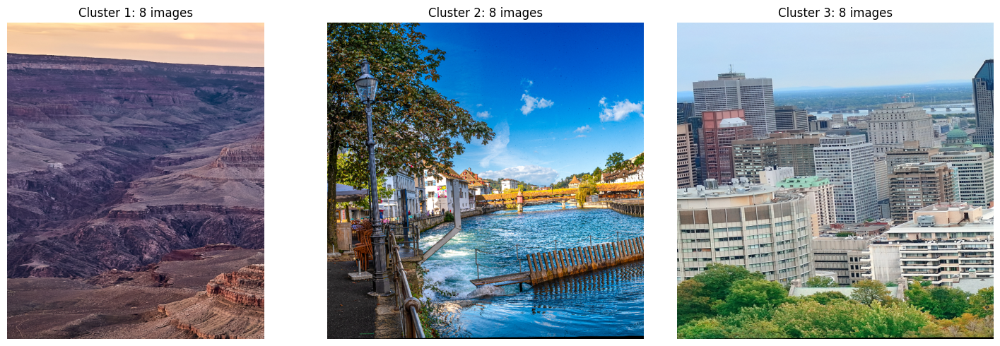


Processing cluster 1 with 8 images
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error computing homography: tuple index out of range
Error comp

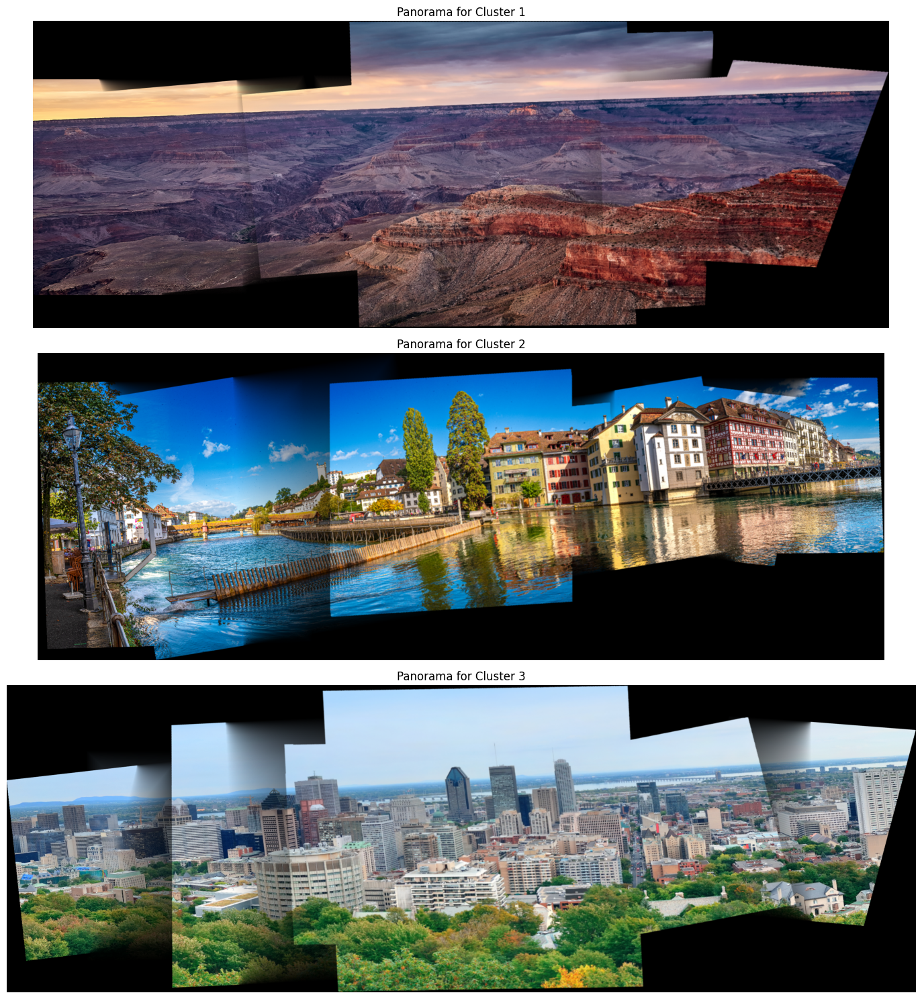

In [ ]:
if __name__ == "__main__":
    dataset_path = 'panorama_dataset'
    panoramas = create_all_panoramas(dataset_path)